In [2]:
import numpy as np
import matplotlib.pyplot as plt
import skimage
from skimage.segmentation import slic, mark_boundaries
from matplotlib.image import imread, imsave

In [3]:
def get_img(path, show=True):
    orig_img = imread(path)
    if show:
        plt.imshow(orig_img)
        plt.show()
        print('Shape : ', orig_img.shape)
    
    return orig_img

In [4]:
class SLICo():
    def __init__(self, img, superpixels=100, compactness=20):
        self.img = img
        self.result = img.copy()
        self.superpixels = superpixels
        self.compactness = compactness
        self.img_h, self.img_w, self.img_d = img.shape
        self.clusters = []
        self.X = [[i, j, img[i, j, 0], img[i, j, 1], img[i, j, 2]] for i in range(self.img_h) for j in range(self.img_w)]
        self.S = int(np.sqrt(self.img_w * self.img_h / self.superpixels))
        
    def calculate_dist(self, cluster, pixel):
        d_xy = np.sqrt((cluster[0] - pixel[0]) ** 2 + (cluster[1] - pixel[1]) ** 2)
        d_col = np.sqrt((cluster[2] - pixel[2]) ** 2 + (cluster[3] - pixel[3]) ** 2 + (cluster[4] - pixel[4]) ** 2)
        return d_col + d_xy * (self.compactness * self.S)

    def distribute_pixels(self):
        # Рассчёт расстояния до кластеров
        for pixel in self.X:
            dist = [self.calculate_dist(C, pixel) for C in self.clusters]
            min_C = [dist.index(min(dist))]
            #print(min_C)
    
    def fit(self):
        # Начальный рассчёт кластеров
        for i in range(self.img_h):
            if i % self.S == 0 and i > 0 and i < self.img_h:
                for j in range(self.img_w):
                    if j % self.S == 0 and j > 0 and j < self.img_w:
                        self.clusters.append([i, j, self.img[i, j, 0], self.img[i, j, 1], self.img[i, j, 2]])
        
        self.clusters = np.array(self.clusters)
        
        self.distribute_pixels()

In [5]:
def calculate_avg_colors(img, slic):
    avg = {}
    img_h, img_w, d = img.shape
    for i in range(img_h):
        for j in range(img_w):
            if slic[i, j] in avg:
                avg[slic[i, j]] = np.array([np.sum([avg[slic[i, j]][0], img[i, j]], axis=0), avg[slic[i, j]][1] + 1])
            else:
                avg[slic[i, j]] = np.array([img[i, j], 1])
    
    for k in avg:
        n = avg[k][1]
        avg[k] = np.array([avg[k][0][0] / n, avg[k][0][1] / n, avg[k][0][2] / n])
    
    return avg
            

e:\python\python36\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  This is separate from the ipykernel package so we can avoid doing imports until


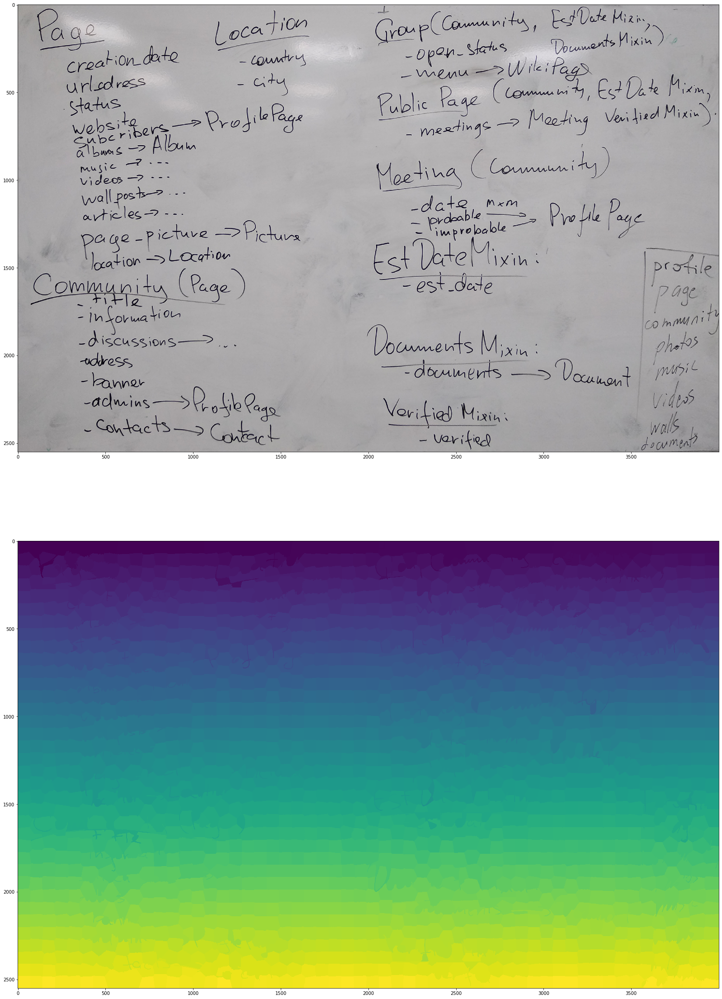

In [12]:
img = get_img('data/boards/cut/IMG_20190218_170650.jpg', show=False)
new_img = img.copy()
slic_img = slic(img, n_segments=2000)

avg = calculate_avg_colors(img, slic_img)

#for i in range(new_img.shape[0]):
    #for j in range(new_img.shape[1]):
        #new_img[i, j] = avg[slic_img[i, j]]

fig, axarr = plt.subplots(nrows=2, ncols=1, figsize=(40, 40))
axarr[0].imshow(img)
axarr[1].imshow(slic_img)
#axarr[1].imshow(new_img)
plt.show()

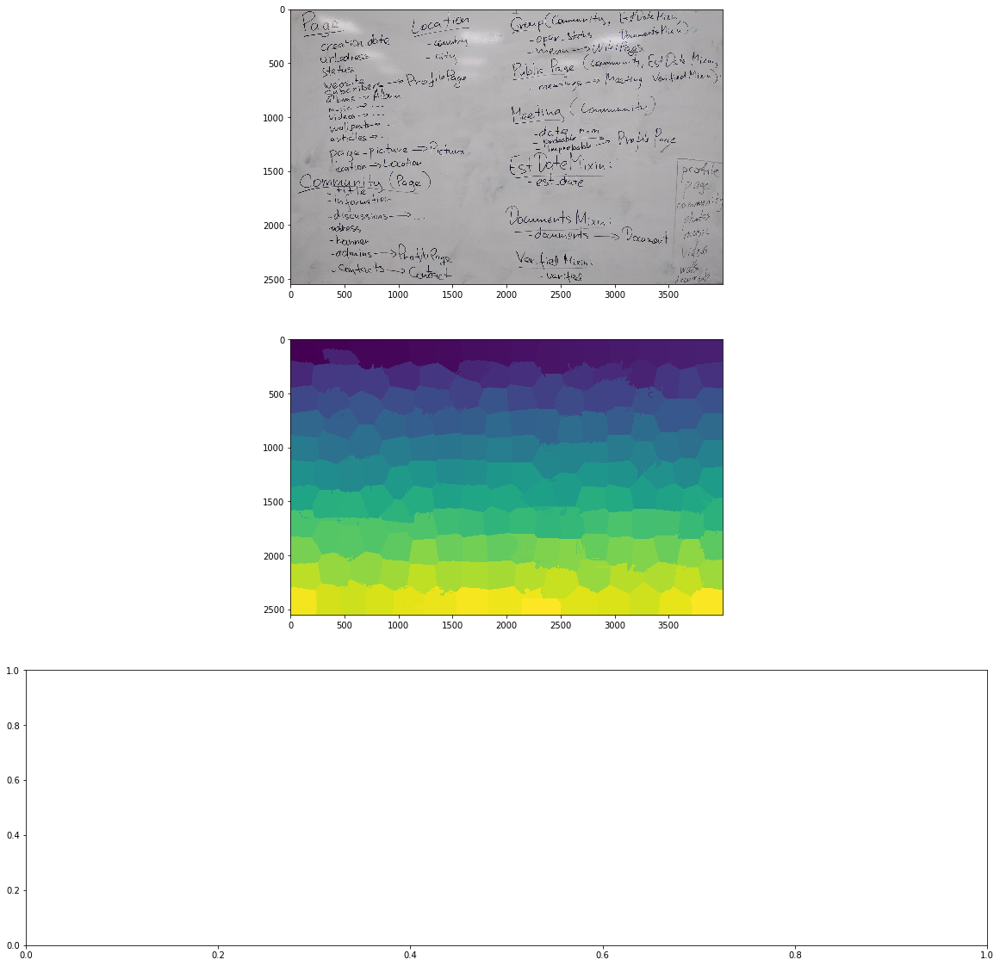

In [10]:
fig, axarr = plt.subplots(nrows=3, ncols=1, figsize=(20, 20))
axarr[0].imshow(img)
axarr[1].imshow(slic_img)
#axarr[2].imshow(new_img)
plt.show()

e:\python\python36\lib\site-packages\ipykernel_launcher.py:9: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  if __name__ == '__main__':


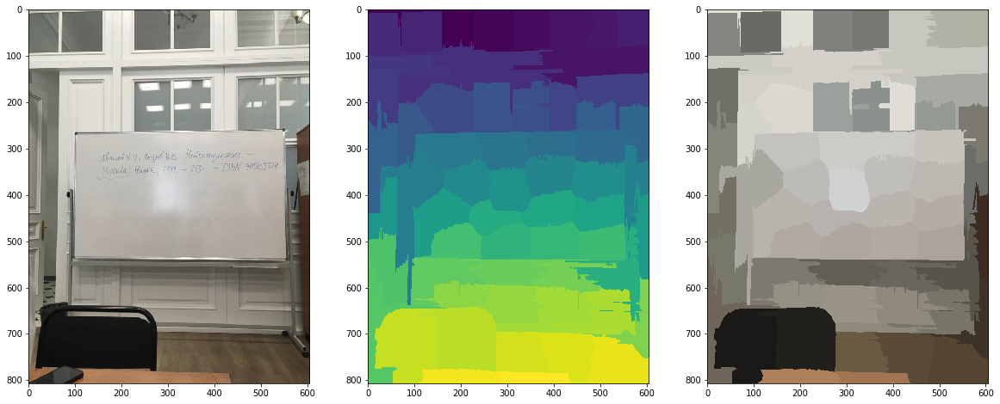

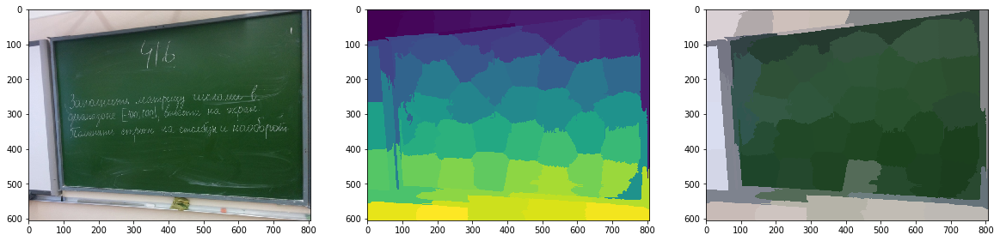

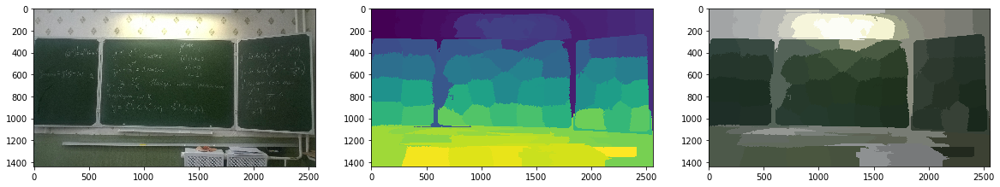

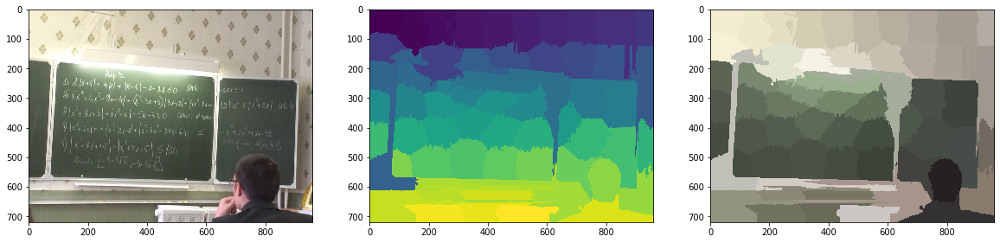

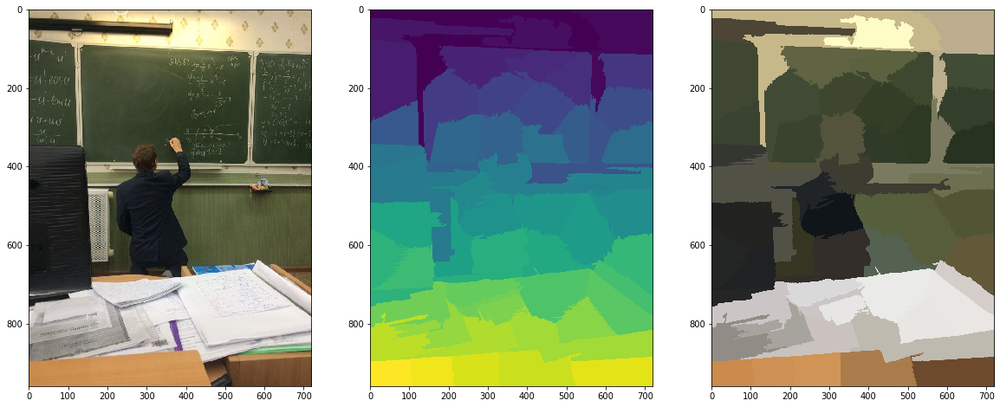

...

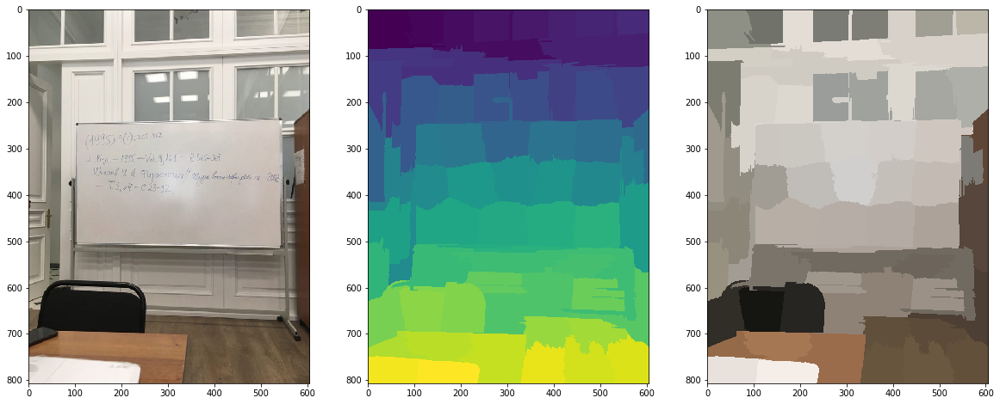

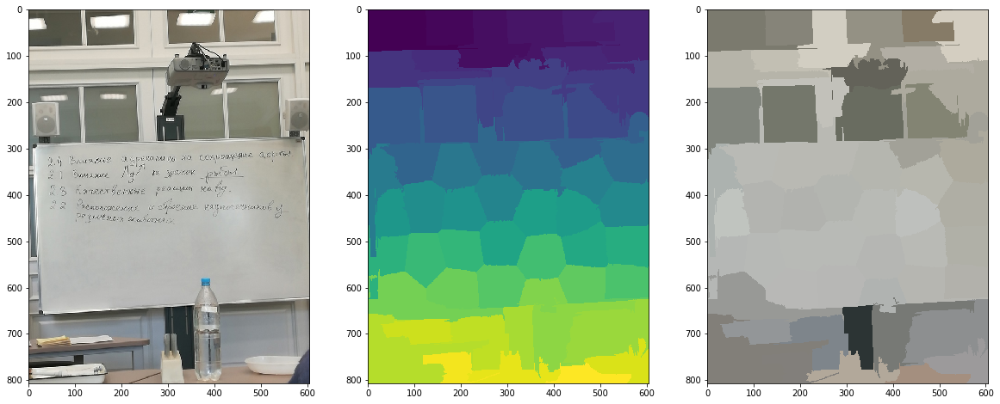

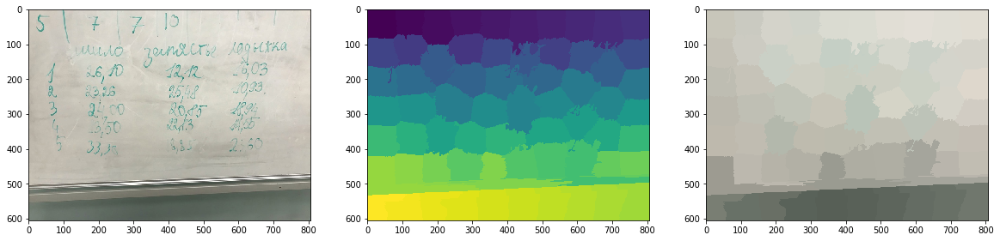

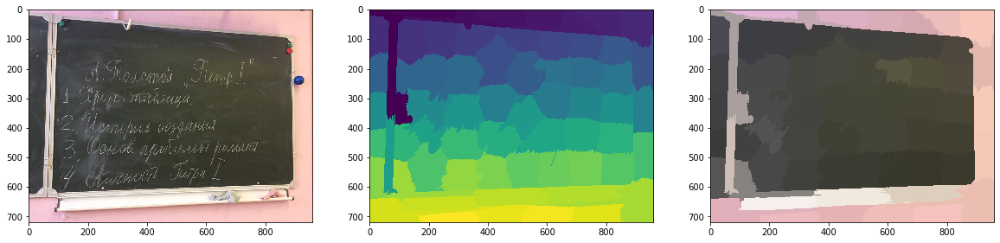

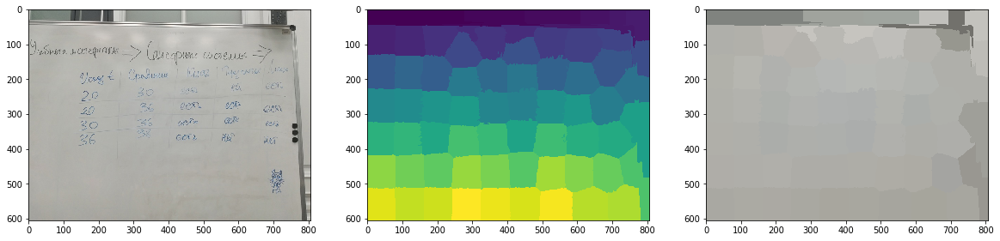

In [43]:
import os
image_list = os.listdir('data/Доски')

images = []

for x in image_list:
    img = get_img('data/Доски/{}'.format(x), show=False)
    new_img = img.copy()
    slic_img = slic(img, n_segments=75)

    avg = calculate_avg_colors(img, slic_img)

    for i in range(new_img.shape[0]):
        for j in range(new_img.shape[1]):
            new_img[i, j] = avg[slic_img[i, j]]

    images.append([img, slic_img, new_img])
            
    fig, axarr = plt.subplots(nrows=1, ncols=3, sharex=True, figsize=(20, 8))
    axarr[0].imshow(img)
    axarr[1].imshow(slic_img)
    axarr[2].imshow(new_img)
    plt.show()

In [6]:
print(images[0][1])

[[ 0  0  0 ...  5  5  5]
 [ 0  0  0 ...  5  5  5]
 [ 0  0  0 ...  5  5  5]
 ...
 [42 42 42 ... 55 55 55]
 [42 42 42 ... 55 55 55]
 [42 42 42 ... 55 55 55]]


In [15]:
import os
import cv2
import numpy as np

image_list = os.listdir('data/Доски/')

images = []

for x in image_list:
    img = get_img('data/Доски/'.format(x))
    print(x, img)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    th = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 15, 5)

    # ищем контуры и складируем их в переменную contours
    contours, hierarchy = cv2.findContours(th, cv2.RETR_LIST , cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img, contours, -1, (255, 0, 0), 3, cv2.LINE_AA, hierarchy, 1)
    cv2.imshow('contours', img) # выводим итоговое изображение в окно
    print(contours, hierarchy)
    cv2.waitKey()
    cv2.destroyAllWindows()

PermissionError: [Errno 13] Permission denied: 'data/Доски/'